In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.mplot3d import Axes3D
import glob
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
from sklearn.cross_validation import train_test_split
from sklearn.svm import LinearSVC
import time
from scipy.ndimage.measurements import label

%matplotlib inline


C:\ProgramData\Miniconda3\envs\carnd-term1\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [46]:
# definition of all the function we might need for training and car detection

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # make a copy of the image
    draw_img = np.copy(img)
    # draw each bounding box on your image copy using cv2.rectangle()
    for box in bboxes:
        cv2.rectangle(draw_img, box[0], box[1], color, thick)
    # return the image copy with boxes drawn
    return draw_img # Change this line to return image copy with boxes

def find_matches(img, template_list):
    # Make a copy of the image to draw on
    # Define an empty list to take bbox coords
    bbox_list = []
    method = cv2.TM_CCORR_NORMED
    # Iterate through template list
    # Read in templates one by one
    # Use cv2.matchTemplate() to search the image
    #     using whichever of the OpenCV search methods you prefer
    # Use cv2.minMaxLoc() to extract the location of the best match
    # Determine bounding box corners for the match
    # Return the list of bounding boxes
    for template in template_list:
        tmp = cv2.imread(template)
        match = cv2.matchTemplate(img, tmp, method)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(match)
        # Determine a bounding box for the match
        w, h = (tmp.shape[1], tmp.shape[0])
        if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)
        # Append bbox position to list
        bbox_list.append((top_left, bottom_right))
        
    return bbox_list

def color_hist(image, nbins=32): #, bins_range=(0, 256)):
    # Compute the histogram of the RGB channels separately
    rhist = np.histogram(image[:,:,0], bins=nbins) #, range=bins_range)
    ghist = np.histogram(image[:,:,1], bins=nbins) #, range=bins_range)
    bhist = np.histogram(image[:,:,2], bins=nbins) #, range=bins_range)
    # Generating bin centers
    bin_edges = rhist[1]

    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return rhist, ghist, bhist, bin_centers, hist_features

def plot3d(pixels, colors_rgb,
        axis_labels=list("RGB"), axis_limits=[(0, 255), (0, 255), (0, 255)]):
    """Plot pixels in 3D."""

    # Create figure and 3D axes
    fig = plt.figure(figsize=(8, 8))
    ax = Axes3D(fig)

    # Set axis limits
    ax.set_xlim(*axis_limits[0])
    ax.set_ylim(*axis_limits[1])
    ax.set_zlim(*axis_limits[2])

    # Set axis labels and sizes
    ax.tick_params(axis='both', which='major', labelsize=14, pad=8)
    ax.set_xlabel(axis_labels[0], fontsize=16, labelpad=16)
    ax.set_ylabel(axis_labels[1], fontsize=16, labelpad=16)
    ax.set_zlabel(axis_labels[2], fontsize=16, labelpad=16)

    # Plot pixel values with colors given in colors_rgb
    ax.scatter(
        pixels[:, :, 0].ravel(),
        pixels[:, :, 1].ravel(),
        pixels[:, :, 2].ravel(),
        c=colors_rgb.reshape((-1, 3)), edgecolors='none')

    return ax  # return Axes3D object for further manipulation

def bin_spatial(img, color_space='RGB', size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    features = np.hstack((color1, color2, color3))
    # Return the feature vector
    return features
"""
    # Convert image to new color space (if specified)
    if color_space == 'RGB':
        conv_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
    elif color_space == 'HSV':
        conv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    elif color_space == 'HLS':
        conv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    elif color_space == 'LUV':
        conv_img = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    # Use cv2.resize().ravel() to create the feature vector
    small_img = cv2.resize(conv_img, size)
    
    features = small_img.ravel() # Remove this line!
"""

def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    img = cv2.imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = img.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = np.array(img).dtype
    # Return data_dict
    return data_dict

def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        # Use skimage.hog() to get both features and a visualization
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell), cells_per_block=(cell_per_block, cell_per_block), visualise=vis, feature_vector=feature_vec, transform_sqrt=False)
        return features, hog_image
    else:      
        # Use skimage.hog() to get features only
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell), cells_per_block=(cell_per_block, cell_per_block), visualise=vis, feature_vector=feature_vec, transform_sqrt=False)
        return features
    
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                    hist_bins=32, #hist_range=(0, 256),
                    orient = 9, pix_per_cell=8, cell_per_block=2, hog_channel=0, spatial_feat=True, hist_feat=True,
                    hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        img = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        else: 
            feature_image = np.copy(img)    
        # Apply bin_spatial() to get spatial color features
        if spatial_feat == True:
            feature_bin = bin_spatial(feature_image, size=spatial_size)
            file_features.append(feature_bin)
        # Apply color_hist() to get color histogram features
        if hist_feat == True:
            rhist, ghist, bhist, bin_centers, hist_features = color_hist(feature_image, nbins=hist_bins) #, bins_range=(0, 256))
            feature_color = np.concatenate((rhist[0],ghist[0],bhist[0]))
            file_features.append(feature_color)
        # Append the new feature vector to the features list
        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_feat == True:
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: 
        feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        rhist, ghist, bhist, bin_centers, hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        hist_features = np.concatenate((rhist[0],ghist[0],bhist[0]))
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True)) 
            hog_features = np.concatenate(hog_features)
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    if vis == True:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, xy_window=(64, 64), color_space = 'RGB2YCrCb'):
    
    heatmap = np.zeros_like(img[:,:,0])
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, color_space)
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
     
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
   
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], xy_window)
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            
            rhist, ghist, bhist, bin_centers, hist_features = color_hist(subimg, nbins=hist_bins)
            #6) Append features to list
            hist_features = np.concatenate((rhist[0],ghist[0],bhist[0]))        

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                # Add heat to each box in box list
                #bboxes = [((xbox_left, xbox_left+win_draw), (ytop_draw+ystart, ytop_draw+win_draw+ystart))]
                #heat = add_heat(heat,bboxes)
    
                # Apply threshold to help remove false positives
                #heat = apply_threshold(heat,1)

                # Visualize the heatmap when displaying    
                #heatmap = np.clip(heat, 0, 255)
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] +=1
                
    return draw_img, heatmap

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])
            
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

In [3]:
#get files for training (car, not car)

cars = glob.glob('./TrainingSet/vehicles/*/*.png')
notcars = glob.glob('./TrainingSet/non-vehicles/*/*.png')

#randomly select a car and not car image
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

# Read in a car / not-car image
car_image = cv2.imread(cars[car_ind])
notcar_image = cv2.imread(notcars[notcar_ind])

#set up parameters for training
color_space = 'YCrCb'
orient = 9
pix_per_cell = 9
cell_per_block = 2
hog_channel = 0
spatial_size = (16, 16)
hist_bins = 16
spatial_feat = True
hist_feat = True
hog_feat = True


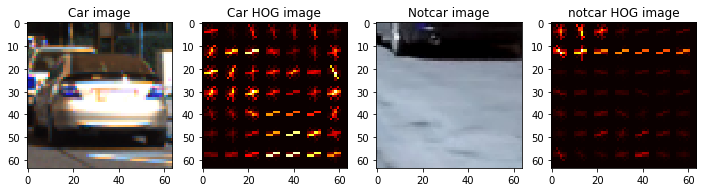

In [4]:
car_features_sing, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)

notcar_features_sing, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis = True)

images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['Car image','Car HOG image','Notcar image','notcar HOG image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)

Function returned a count of 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: uint8


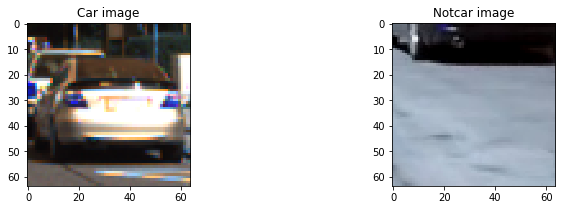

In [5]:
#Data exploration
data_info = data_look(cars, notcars)

print('Function returned a count of', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])


# Read in a car / not-car image
car_image = cv2.imread(cars[car_ind])
notcar_image = cv2.imread(notcars[notcar_ind])


# Plot the examples
images = [car_image, notcar_image]
titles = ['Car image','Notcar image']

flg = plt.figure(figsize=(12,3))
visualize(fig, 1, 2, images, titles)

input_shape =  (3,64,64)

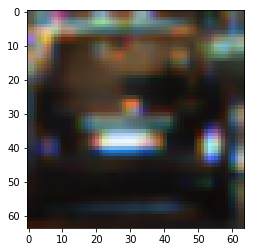

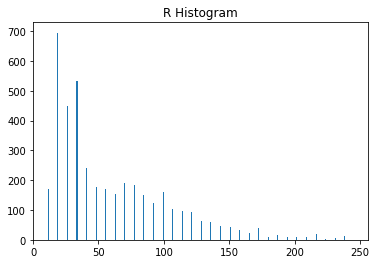

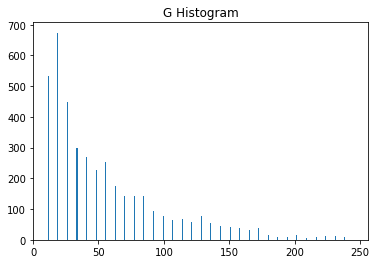

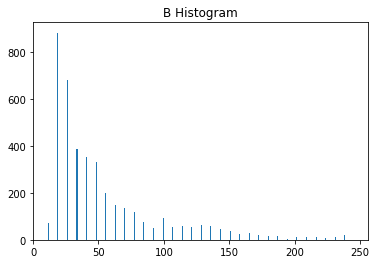

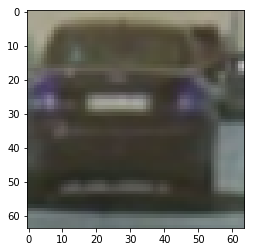

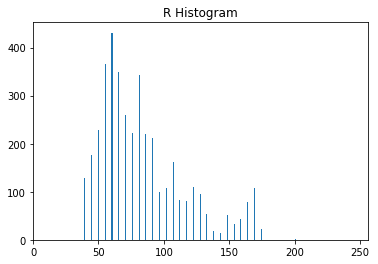

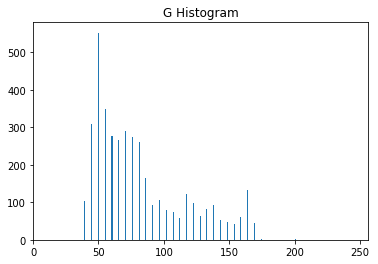

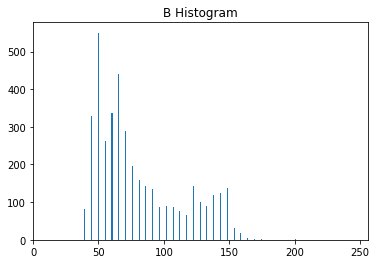

In [92]:
#Comparison of 2 car color histograms

car_ind1 = np.random.randint(0, len(cars))
car_ind2 = np.random.randint(0, len(cars))

image1 = cv2.imread(cars[car_ind1])
image2 = cv2.imread(cars[car_ind2])

rh1, gh1, bh1, bincen1, feature_vec1 = color_hist(image1, nbins=32) #, bins_range=(0, 256))

if rh1 is not None:
    plt.imshow(image1)
    plt.show()
    #fig = plt.figure(figsize=(12,3))
    #plt.subplot(131)
    plt.bar(bincen1, rh1[0])
    plt.xlim(0, 256)
    plt.title('R Histogram')
    plt.show()
    #plt.subplot(132)
    plt.bar(bincen1, gh1[0])
    plt.xlim(0, 256)
    plt.title('G Histogram')
    plt.show()
    #plt.subplot(133)
    plt.bar(bincen1, bh1[0])
    plt.xlim(0, 256)
    plt.title('B Histogram')
    plt.show()
    #fig.tight_layout()
else:
    print('Function is returning None for at least one variable...')

rh2, gh2, bh2, bincen2, feature_vec2 = color_hist(image2, nbins=32) #, bins_range=(0, 256))

if rh2 is not None:
    plt.imshow(image2)
    plt.show()
    #fig = plt.figure(figsize=(12,3))
    #plt.subplot(131)
    plt.bar(bincen2, rh2[0])
    plt.xlim(0, 256)
    plt.title('R Histogram')
    plt.show()
    #plt.subplot(132)
    plt.bar(bincen2, gh2[0])
    plt.xlim(0, 256)
    plt.title('G Histogram')
    plt.show()
    #plt.subplot(133)
    plt.bar(bincen2, bh2[0])
    plt.xlim(0, 256)
    plt.title('B Histogram')
    plt.show()
    #fig.tight_layout()
else:
    print('Function is returning None for at least one variable...')

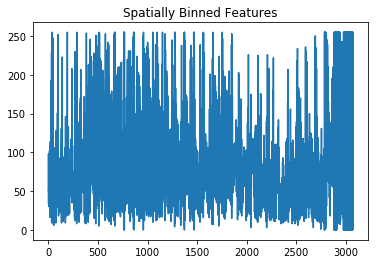

In [58]:
#Spatial binning
feature_vec = bin_spatial(image1, color_space='HSV', size=(32, 32))

# Plot features
plt.plot(feature_vec)
plt.title('Spatially Binned Features')
plt.show()


In [20]:
color_space = 'YCrCb'
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL'
spatial_size = (32, 32)
hist_bins = 32
spatial_feat = True
hist_feat = True
hog_feat = True

t=time.time()
#n_samples = 2
#random_idxs = np.random.randint(0,len(cars), n_samples)

#test_cars = np.array(cars)[random_idxs]
#test_notcars = np.array(notcars)[random_idxs]

car_features = extract_features(cars, color_space=color_space, spatial_size=spatial_size, hist_bins=hist_bins, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat,hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, spatial_size=spatial_size, hist_bins=hist_bins, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat,hog_feat=hog_feat)

t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract features...')
# Create an array stack of feature vectors

X = np.vstack((car_features, notcar_features)).astype(np.float64)


# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.1, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
#t=time.time()
#n_predict = 10
#print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
#print('For these',n_predict, 'labels: ', y_test[0:n_predict])
#t2 = time.time()
#print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

164.91 Seconds to extract features...
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460
105.09 Seconds to train SVC...
Test Accuracy of SVC =  0.9882


1.125192403793335 seconds to process the exampe images 125 windows
1.3282430171966553 seconds to process the exampe images 125 windows
1.0598948001861572 seconds to process the exampe images 125 windows
1.046931266784668 seconds to process the exampe images 125 windows
1.0359771251678467 seconds to process the exampe images 125 windows
0.9844276905059814 seconds to process the exampe images 125 windows


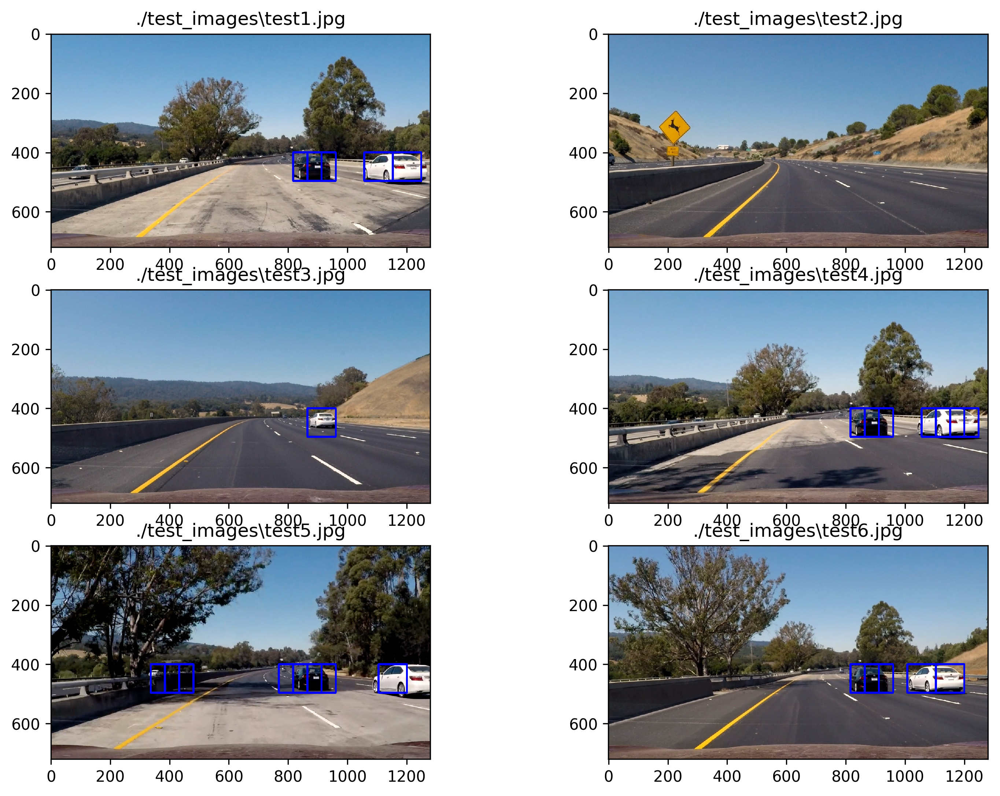

In [25]:
examples = glob.glob('./test_images/test*.jpg')
images = []
titles = []
y_start_stop = [400, 720]
overlap = 0.5

#looping through all the example images
for file in examples:
    t1 = time.time()
    #read image
    img = mpimg.imread(file)
    draw_img = np.copy(img)
    #normalize image data
    img = img.astype(np.float32)/255
    
    #determine window locations
    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                        xy_window=(96, 96), xy_overlap=(overlap, overlap))
    
    #run classifier on image 
    hot_windows = search_windows(img, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       
    
    #draw boxes around detected cars
    window_img = draw_boxes(draw_img, hot_windows, color=(0, 0, 255), thick=6)                    

    images.append(window_img)
    titles.append(file)
    print(time.time()-t1, 'seconds to process the exampe images', len(windows), 'windows')

fig = plt.figure(figsize=(12,18), dpi = 300)
visualize(fig, len(examples), 2, images, titles)



2 cars found
0.890669584274292 seconds to process the exampe image
0 cars found
0.8594777584075928 seconds to process the exampe image
0 cars found
0.8201072216033936 seconds to process the exampe image
2 cars found
0.812537670135498 seconds to process the exampe image
1 cars found
0.8750472068786621 seconds to process the exampe image
2 cars found
0.8598568439483643 seconds to process the exampe image


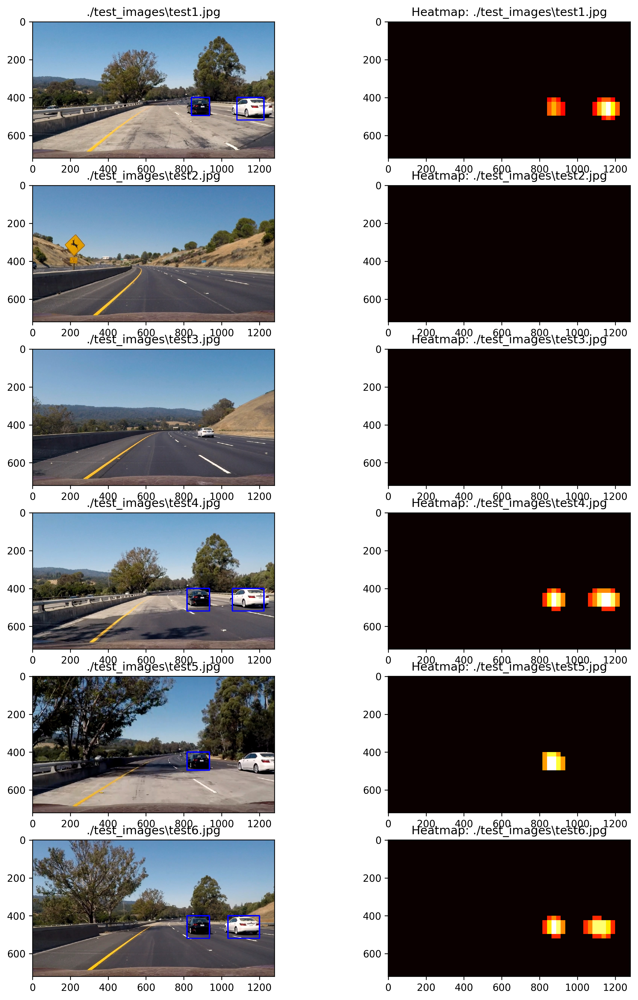

In [58]:
examples = glob.glob('./test_images/test*.jpg')
conv_color = 'RGB2YCrCb'

images = []
titles = []
y_start_stop = [400, 656]
scale = 1.5
xy_window=(96, 96)
thresh = 2

for file in examples:
    t1 = time.time()
    #read image
    img = mpimg.imread(file)
    #get detected and heatmap image
    out_img, heatmap = find_cars(img, y_start_stop[0], y_start_stop[1], scale, svc, X_scaler, 
                                 orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, 
                                 xy_window, conv_color)                 
    
    #apply threshold to remove false positives
    heatmap = apply_threshold(heatmap, thresh)
    #use label to determine number of cars and get labeled picture
    labels = label(heatmap)
    #draw bounding boxes around cars instead of overlapping boxes
    lab_img = draw_labeled_bboxes(np.copy(img), labels)
    images.append(lab_img)
    images.append(heatmap)
    titles.append(file)
    titles.append('Heatmap: '+file)
    print(labels[1], 'cars found')
    print(time.time()-t1, 'seconds to process the exampe image')

fig = plt.figure(figsize=(12,18), dpi = 300)
visualize(fig, len(examples), 2, images, titles)






In [54]:
def process_image(img):
    #set parameters for classification
    y_start_stop = [400, 656]
    scale = 1.5
    xy_window=(96, 96)
    thresh = 2
    conv_color = 'RGB2YCrCb'
    orient = 9
    pix_per_cell = 8
    cell_per_block = 2
    hog_channel = 'ALL'
    spatial_size = (32, 32)
    hist_bins = 32
    
    #get detected and heatmap image
    
    out_img, heatmap = find_cars(img, y_start_stop[0], y_start_stop[1], scale, svc, X_scaler, 
                                 orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, 
                                 xy_window,conv_color)                 
    
    #apply threshold to remove false positives
    heatmap = apply_threshold(heatmap, thresh)
    #use label to determine number of cars and get labeled picture
    labels = label(heatmap)
    #draw bounding boxes around cars instead of overlapping boxes
    lab_img = draw_labeled_bboxes(np.copy(img), labels)
    
    return lab_img

In [55]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

OutputVideo = 'project_output.mp4'
InputVideo = 'project_video.mp4'

clip = VideoFileClip(InputVideo)
#clip = VideoFileClip(InputVideo).subclip(35,45)
#clip.save_frame("frame09.jpg", t=9)
#clip.save_frame("frame40.jpg", t=40)
#img = cv2.imread('frame.jpg')
#result = process(img)

#write_name = 'sl_curve.jpg'

#cv2.imwrite(write_name,result)
    
video_clip = clip.fl_image(process_image)

video_clip.write_videofile(OutputVideo, audio=False)

[MoviePy] >>>> Building video project_output2.mp4
[MoviePy] Writing video project_output2.mp4


100%|█████████████████████████████████████▉| 1260/1261 [20:54<00:00,  1.03it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output2.mp4 

